# Introduction

Let us consider the following PDE:

$$\frac{\partial u}{\partial t} = f(u)$$

which describes a fluid velocity $u(x,t)$ in space $x$ and time $t$, in the absence of forcing. Discretizing this equation in space yields the following system of ODEs:

$$\frac{\mathrm{d}\mathbf{u}}{\mathrm{d}t} = f_h(\mathbf{u}),$$

where $\mathbf{u} \in \mathbb{R}^N$, $\mathrm{u}_i(t) \approx u(x_i,t)$ and $f_h$ is the spatial discretization of $f$. In this way the equation is solved on a grid spanning some domain $x\in\Omega$. 

These PDE systems are typically derived from underlying conservation laws such as momentum and energy conservation. Structure-preserving discretizations can be used to satisfy these laws in the discrete setting. Here, the momentum conservation condition takes the form

$$
\frac{\mathrm{d}P_h}{\mathrm{d}t} = \mathbf{1}^T_\omega \boldsymbol{\omega}f_h(\mathbf{u}) = 0,
$$

whereas energy-conservation takes the form

$$\frac{\mathrm{d}E_h}{\mathrm{d}t} = \mathbf{u}^T\boldsymbol{\omega}f_h(\mathbf{u}) = 0$$

for $P_h = \mathbf{1}^T_\omega \boldsymbol{\omega}\mathbf{u}$ and $E_h = \frac{1}{2}\mathbf{u}^T_\omega \boldsymbol{\omega}\mathbf{u}$, and $\boldsymbol{\omega}\in \mathbb{R}^{N\times N}$ being the matrix containing the cell volumes of the grid. For viscous flows energy is dissipated. This changes the latter condition to

$$\frac{\mathrm{d}E_h}{\mathrm{d}t} = \mathbf{u}^T\boldsymbol{\omega}f_h(\mathbf{u}) \leq 0.$$

The problem is that these discretized ODE systems are required to be of high dimension in the case of turbulent flows. In this notebook we show that we can resolve this issue by filtering the discretized PDE onto a coarse grid, while still satisying the underlying conservation laws.

# Import packages

In [1]:
using LinearAlgebra
using Plots
using SparseArrays



include("src/ECNCM_1D.jl")

using Distributions
using JLD

using Flux
using Random
using LaTeXStrings
using ProgressBars


# Define RHS

In this case we consider the viscouse Burgers equation of the form 

$$\frac{\partial u}{\partial t} = -\frac{1}{2}\frac{\partial u^2}{\partial x} + \nu\frac{\partial ^2u}{\partial x^2}.$$

Discertizing this PDE gives the following system of ODEs

$$\frac{\mathrm{d}\mathbf{u}}{\mathrm{d}t} = -\mathbf{G}_h(\mathbf{u}) + \nu\mathbf{D}_2\mathbf{u},$$

where $\mathbf{G}_h$ is an energy and momentum conserving discretization of the non-linear convection operator and $\mathbf{D}_2$ a simple momentum-conserving central difference approximation of the second derivative. We set the viscocity to $\nu=\frac{1}{100}$.

Below, we implement this discretization of Burgers equation using convolutional kernels.

In [2]:
function gen_conv_burgers_dudt(viscosity)
    conv_D1 = gen_conv_stencil([-1.,0.,1.]) # Central diff. approximation first derivative
    conv_D2 = gen_conv_stencil([1.,-2.,1.]) # Central diff. approximation second derivative
    function burgers_dudt(u,x,t,D1=conv_D1,D2 = conv_D2,viscosity =  viscosity)
        if length(size(u)) == 1
            u = reshape(u,(size(u)[1],1)) 
        end
        dx = x[2]-x[1]
        u = reshape(u,(size(u)[1],1,size(u)[2])) # Reshape u to supply to neural network

        G = (1/3)*((1/(2*dx))*(D1(u.^2) .+ u[2:end-1,:,:] .* D1(u))) # Convection term
        D2_u = (1/(dx^2))*D2(u) # Diffusive term

        return reshape(-G .+ viscosity*D2_u,(size(u)[1]-2,size(u)[3])) # Reshape back to one solution per column
    end
    return burgers_dudt
end

f = gen_conv_burgers_dudt(1/100) # gen_conv_KdV_dudt() to switch to Korteweg-de Vries equation

(::var"#burgers_dudt#123"{Chain{Tuple{Conv{1, 1, typeof(identity), Array{Float32, 3}, Bool}}}, Chain{Tuple{Conv{1, 1, typeof(identity), Array{Float32, 3}, Bool}}}, Float64}) (generic function with 4 methods)

# Filtering

In order to reduce the dimensionality of the problem we apply a spatial averaging filter $\mathbf{W}\in \mathbb{R}^{I\times N}$ to the solution to obtain the filtered solution

$$\bar{\mathbf{u}} := \mathbf{W}\mathbf{u}$$

For $I<<N$. When $N$ is not divisble by $I$ we first project $\mathbf{u}$ on an appropriate grid through multiplication by the interpolation matrix, before doing the filtering.
The evolution of $\bar{\mathbf{u}}$ is typically written as

$$\frac{\mathrm{d}\bar{\mathbf{u}}}{\mathrm{d}t} = f_H(\bar{\mathbf{u}}) + \underbrace{(\mathbf{W}f_h(\mathbf{u})-f_H(\bar{\mathbf{u}}))}_{=:\mathbf{c}(\mathbf{u})},$$

where $f_H(\bar{\mathbf{u}})$ represents a coarse discretization of $f$ corresponding to the coarse grid on which $\bar{\mathbf{u}}$ lives. The commutator error $\mathbf{c}(\mathbf{u})$ is referred to as the closure term. The problem is that to compute this closure term exactly we require the full solution $\mathbf{u}$, leaving the problem to be high dimensional. To circumvent this we aim to model the closure term by some approximation $\tilde{\mathbf{c}}(\bar{\mathbf{u}})$.

In order to explicitly calculate what is filtered out we define the reconstruction operator $\mathbf{R}$:

$$ \mathbf{R} :=  \boldsymbol{\omega}^{-1} \mathbf{W}^T\boldsymbol{\Omega},$$

where $\boldsymbol{\Omega}$ contains the cell volumes of the coarse grid. The subgrid-scale (SGS) content $\mathbf{u}^\prime$ is then obtained by doing

$$\mathbf{u}^\prime := \mathbf{u} - \mathbf{R}\bar{\mathbf{u}}$$

with time evolution

$$\frac{\mathrm{d}\mathbf{u}^\prime}{\mathrm{d}t} = \frac{\mathrm{d}\mathbf{u}}{\mathrm{d}t} - \mathbf{R}\frac{\mathrm{d}\bar{\mathbf{u}}}{\mathrm{d}t}.$$

Below, we define the size of the spatial domain $\Omega = [0,2\pi]$ along with the resolution of our reference and coarsened grids. In return we obtain the introduced operators.

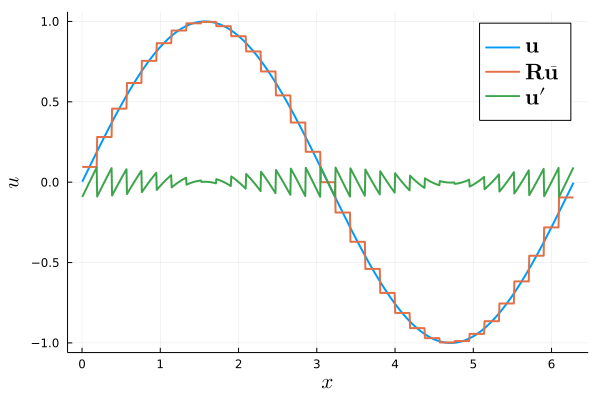

In [73]:
domain_range = 2*pi # Size of the spatial domain

N = 1000
I = 33 # Recommend I<=50 for dt_bar = 0.01. Please decrease dt_bar when taking I>50.

domain_descriptors=generate_domain_and_filters(domain_range,I,N)
domain_range,interpolation_matrix,(N,I,J),(X,x,ref_x),(Omega,omega,ref_omega),(W,R),(IP,ip,ref_ip),(INTEG,integ,ref_integ) = domain_descriptors

u = sin.(2*pi/domain_range*ref_x)
u_bar = R*W*interpolation_matrix*u
u_prime = interpolation_matrix*u.-u_bar

plot(ref_x,u,xlabel = L"x",ylabel = L"u",label = L"\mathbf{u}",width = 2,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:topright,legendfont=font(15))
plot!(x,u_bar,label = L"\mathbf{R}\bar{\mathbf{u}}",width = 2)
plot!(x,u_prime,label = L"\mathbf{u} \prime",width = 2)

# Generate reference data

In order to obtain a good closure model $\tilde{\mathbf{c}}(\bar{u})$ we first generate reference data by simulating from $10$ different initial conditions for $t\in[0,5]$. We consider both periodic and unsteady in-outflow (I/O) boundary conditions (BCs) + forcing.
For details on how these conditions are generated we refer to the paper. 

In [74]:
## Paremeters for constructing the intial conditions
offset = 2 # Constant offset of the initial conditions

min_mode = 2 # Minimum wavenumber
max_mode = 8 # Maximum wavenumber

scaling = 0.6 # Scale the waves

0.6

In [75]:
#############################
dt = 0.001 # time-step size
T = 5 # simulate until t=T
save_every = 10 # save reference data every 10 time-steps
samples = 10 # number of simulations


us = Array{Float64}(undef, size(ref_x)[1], 0) # Store solution vectors
dus = Array{Float64}(undef, size(ref_x)[1], 0) # Store RHS
as = Array{Float64}(undef,  1,0) # Store left BC
bs = Array{Float64}(undef,  1,0) # Store right BC
ts = Array{Float64}(undef,  1,0) # Store time
Fs = Array{Float64}(undef, size(ref_x)[1], 0) # Store forcing



for sample in tqdm(1:samples)
    in_outflow = sample % 2 == 0 # Checking if sample is even to determine type of BCs
    
    # Generate initial condition + BCs + forcing
    u0,BC_f,a,b,F = gen_rand_condition(domain_descriptors,f,offset,min_mode,max_mode,in_outflow = in_outflow,scaling = scaling)
    
    # Simulate the flow
    u,du,t = simulation(u0,ref_x,dt,T,  BC_f  ,F = F,save_every = save_every,pre_allocate = true) # simulate
    
    # Save quantities
    us = [us u]
    dus = [dus du]
    ts = [ts t]
    as = [as a(t)]
    bs = [bs b(t)]
    Fs = [Fs  (0*u .+ F)]

end
d = save("training_data.jld","us",us,"dus",dus,"ts",ts,"as",as,"bs",bs,"Fs",Fs) # Save training data

example_us = us[:,1:round(Int,size(us)[2]/samples)]
example_t = ts[:,1:round(Int,size(us)[2]/samples)]'
us = 0
dus = 0
ts = 0
as = 0
bs = 0
fs = 0

0.0%┣                                               ┫ 0/10 [00:00<00:-1, -0s/it]
10.0%┣████▏                                     ┫ 1/10 [00:01<Inf:Inf, InfGs/it]
20.0%┣█████████▍                                     ┫ 2/10 [00:03<00:24, 3s/it]
30.0%┣██████████████                                 ┫ 3/10 [00:04<00:15, 2s/it]
40.0%┣██████████████████▉                            ┫ 4/10 [00:06<00:12, 2s/it]
50.0%┣███████████████████████▌                       ┫ 5/10 [00:07<00:09, 2s/it]
60.0%┣████████████████████████████▏                  ┫ 6/10 [00:09<00:07, 2s/it]
70.0%┣█████████████████████████████████              ┫ 7/10 [00:11<00:05, 2s/it]
80.0%┣█████████████████████████████████████▋         ┫ 8/10 [00:12<00:04, 2s/it]
90.0%┣██████████████████████████████████████████▎    ┫ 9/10 [00:14<00:02, 2s/it]
100.0%┣█████████████████████████████████████████████┫ 10/10 [00:16<00:00, 2s/it]
100.0%┣█████████████████████████████████████████████┫ 10/10 [00:16<00:00, 2s/it]


0

## Animate solution

┌ Info: Saved animation to 
│   fn = /home/toby/Projects/ECNCM_1D/example_flow.gif
└ @ Plots /home/toby/.julia/packages/Plots/FCUr0/src/animation.jl:137


Plots.AnimatedGif("/home/toby/Projects/ECNCM_1D/example_flow.gif")
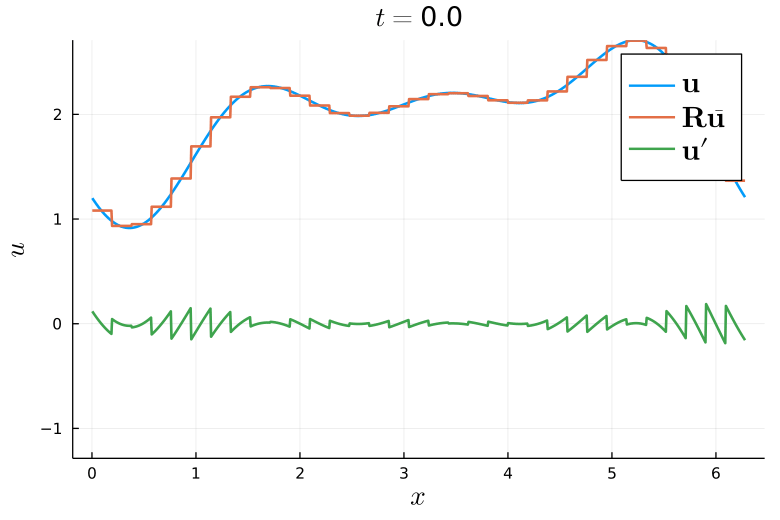

In [76]:
u_bars = R*W*interpolation_matrix*example_us
u_primes = interpolation_matrix*example_us .- u_bars

ymin = minimum([minimum(example_us),minimum(u_primes)])
ymax = maximum(example_us)

anim = @animate for index in 1:size(example_us)[2]
    plot(ref_x,example_us[:,index],width = 2,label = L"\mathbf{u}" ,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:topright,legendfont=font(15), ylim=(ymin, ymax))
    plot!(x,u_bars[:,index],width = 2,label = L"\mathbf{R}\bar{\mathbf{u}}")
    plot!(x,u_primes[:,index],width = 2,label = L"\mathbf{u} \prime")
    xlabel!(L"x")
    ylabel!(L"u")
    title!(L"t = " * string(round(example_t[index],digits = 1)))
end

gif(anim, "example_flow.gif", fps = 30)

# Process reference data

Here we process the reference data by applying the appropriate filters and split the dataset into a training and test set. The dataset include: $\bar{\mathbf{u}},\mathbf{u^\prime},f_H(\bar{\mathbf{u}}),\frac{\mathrm{d}\bar{\mathbf{u}}}{\mathrm{d}t}$,$\frac{\mathrm{d}\mathbf{u}^\prime}{\mathrm{d}t}$, forcing, boundary conditions, etc.

In [77]:
train_fraction = 0.7 # Split the reference data into 70% training set and 30% test set
fraction = 0.1 # Reduce the size of the datasets by randomly sampling 10% for training and testing

data,test_data, indexes,test_indexes = gen_train_test_set((load("training_data.jld")[i] for i in ("us","dus","ts","as","bs","Fs")),f,domain_descriptors,fraction,train_fraction)
data

Dict{String, AbstractMatrix{Float64}} with 18 entries:
  "dE_bar"    => [-0.0544998; 3.13552; … ; -0.945502; 2.48804;;]
  "du_bar"    => [1.31836 3.03395 … -0.971094 1.42339; 0.374238 3.1026 … -0.861…
  "E_bar"     => [13.2472; 13.0961; … ; 12.5466; 16.4745;;]
  "phys_du"   => [1.31663 2.32586 … -0.696336 1.34175; 0.382425 2.90605 … -0.83…
  "E_prime"   => [0.00781129; 0.00144547; … ; 0.000287502; 0.0198467;;]
  "du"        => [1.8478 2.85212 … -1.02578 0.850252; 1.80902 2.86774 … -1.0220…
  "HR_u_bar"  => [1.08109 2.5177 … 1.81335 2.5695; 1.08109 2.5177 … 1.81335 2.5…
  "dE"        => [-0.0520242; 3.14194; … ; -0.944664; 3.27037;;]
  "E"         => [13.255; 13.0976; … ; 12.5469; 16.4944;;]
  "a"         => [NaN 2.63272 … 1.75928 2.61659]
  "u_prime"   => [0.118442 0.108122 … -0.050384 0.0450171; 0.108906 0.101166 … …
  "HR_du_bar" => [1.31836 3.03395 … -0.971094 1.42339; 1.31836 3.03395 … -0.971…
  "b"         => [NaN NaN … NaN NaN]
  "u_bar"     => [1.08109 2.5177 … 1.81335 2.5695; 0

# Structure and filtering

For the spatial averaging filter the momentum conservation condition is unchanged

$$\frac{\mathrm{d}P_h}{\mathrm{d}t} = \mathbf{1}^T_\Omega\boldsymbol{\Omega}\frac{\mathrm{d}\bar{\mathbf{u}}}{\mathrm{d}t} = 0 $$

leaving the following constraint on the approximated closure term:

$$\mathbf{1}^T_\Omega\boldsymbol{\Omega}\tilde{\mathbf{c}}(\bar{\mathbf{u}})=0.$$

For energy conservation the story is slightly more complicated. This condition changes to 

$$\frac{\mathrm{d}E_h}{\mathrm{d}t} = \bar{\mathbf{u}}^T\boldsymbol{\Omega}\frac{\mathrm{d}\bar{\mathbf{u}}}{\mathrm{d}t} +(\mathbf{u}^\prime)^T \boldsymbol{\omega} \frac{\mathrm{d}\mathbf{u}^\prime}{\mathrm{d}t} = 0$$

or $\ldots \leq 0$ in our viscous case, with the energy being decomposed as 

$$E_h = \underbrace{\frac{1}{2}\bar{\mathbf{u}}^T\boldsymbol{\Omega}\bar{\mathbf{u}}}_{=:\bar{E}_h} + \underbrace{\frac{1}{2}(\mathbf{u}^\prime)^T \boldsymbol{\omega}\mathbf{u}^\prime}_{=:E^\prime_h}$$

into resolved energy $\bar{E}_h$ and SGS energy $E^\prime_h$ without cross-term. To circumvent the appearance of the SGS content in this equation we propose to compress the information contained in $\mathbf{u}^\prime$ by a learned linear filter $\mathbf{T}\in \mathbb{R}^{I\times N}$:

$$\mathbf{s} = \mathbf{T}\mathbf{u}^\prime,$$

where $\mathbf{s}\in \mathbb{R}^I$ are the SGS variables
This SGS filter is learned such that we minimize following:

$$\mathcal{L}_s = \sqrt{(\underbrace{\frac{1}{2}\mathbf{s}^T\boldsymbol{\Omega}\mathbf{s}}_{=:\mathcal{S}} - E^\prime_h)^2}$$. 

We can thus approximate the energy conservation condtion as 

$$\frac{\mathrm{d}E_h}{\mathrm{d}t} = \bar{\mathbf{u}}^T\boldsymbol{\Omega}\frac{\mathrm{d}\bar{\mathbf{u}}}{\mathrm{d}t} +\mathbf{s}^T\boldsymbol{\Omega}\frac{\mathrm{d}\mathbf{s}}{\mathrm{d}t} = 0\text{ or } \leq 0.$$

Finally, $\frac{\mathrm{d}\mathbf{s}}{\mathrm{d}t}$ is given by 

$$\frac{\mathrm{d}\mathbf{s}}{\mathrm{d}t} = \mathbf{T}\frac{\mathrm{d}\mathbf{u}^\prime}{\mathrm{d}t}.$$

## Energy of the simulation

Note that $\bar{E}_h \leq E_h$.

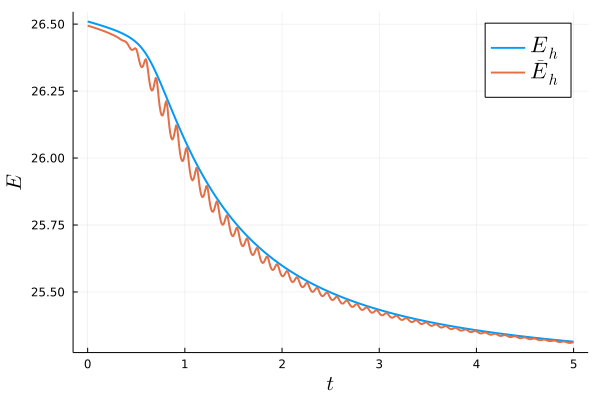

In [78]:
plot(example_t,ref_integ(example_us.^2),width = 2,label = L"E_h" ,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:topright,legendfont=font(15))
plot!(example_t,integ(u_bars.^2),width = 2,label = L"\bar{E}_h")
xlabel!(L"t")
ylabel!(L"E")

# Optimizing the SGS filter

Below, we initialize the SGS filter and minimize $\mathcal{L}_s$ on our training set and evaluate the results on the test set.

In [79]:
outflow =true # Whether or not the dataset includes I/O BC simulations 
subgrid_filter,subgrid_descriptors = gen_subgrid_filter(domain_descriptors,outflow) # Initialize subgrid filter

subgrid_data_loader = Flux.Data.DataLoader((data["u_prime"],), batchsize=200,shuffle=true)

# Defining our model, optimization algorithm and loss function
subgrid_loss(u_primes,subgrid_filter = subgrid_filter,domain_descriptors = domain_descriptors) = subgrid_filter_loss(u_primes,subgrid_filter,domain_descriptors)

opt = ADAM()
ps = Flux.params(subgrid_descriptors)
epochs =200
losses = zeros(epochs)

for epoch in tqdm(1:epochs)
    Flux.train!(subgrid_loss, ps,subgrid_data_loader, opt)
    train_loss = subgrid_loss(data["u_prime"])
    losses[epoch] = train_loss
end

t_stencil = gen_t_stencil(subgrid_descriptors,domain_descriptors,outflow) # SGS filter stencil
T_mat = gen_T(t_stencil,domain_descriptors) # construct the SGS filter


# Include SGS variables in the training and test datasets
data["s"] = T_mat*data["u_prime"]
data["ds"] = T_mat*data["du_prime"]

test_data["s"] = T_mat*test_data["u_prime"]
test_data["ds"] = T_mat*test_data["du_prime"]



0.0%┣                                             ┫ 0/200 [00:00<00:-10, -0s/it]
0.5%┣▏                                         ┫ 1/200 [00:04<Inf:Inf, InfGs/it]
1.0%┣▌                                              ┫ 2/200 [00:04<14:47, 4s/it]
1.5%┣▊                                              ┫ 3/200 [00:05<07:28, 2s/it]
2.0%┣█                                              ┫ 4/200 [00:05<05:01, 2s/it]
3.0%┣█▍                                             ┫ 6/200 [00:05<03:03, 1it/s]
3.5%┣█▋                                             ┫ 7/200 [00:05<02:33, 1it/s]
4.5%┣██▏                                            ┫ 9/200 [00:05<01:56, 2it/s]
5.0%┣██▎                                           ┫ 10/200 [00:05<01:44, 2it/s]
5.5%┣██▌                                           ┫ 11/200 [00:05<01:34, 2it/s]
6.5%┣███                                           ┫ 13/200 [00:05<01:19, 2it/s]
7.0%┣███▏                                          ┫ 14/200 [00:05<01:14, 3it/s]
7.5%┣███▌                   

99.5%┣██████████████████████████████████████████▉┫ 199/200 [00:15<00:00, 13it/s]
100.0%┣██████████████████████████████████████████┫ 200/200 [00:15<00:00, 13it/s]
100.0%┣██████████████████████████████████████████┫ 200/200 [00:15<00:00, 13it/s]


33×151 Matrix{Float64}:
 -0.00228344   0.00214489  -0.212046   …   0.0432056   -0.00413613
 -0.00227037  -0.092958    -0.0966852      0.0201293   -0.00249614
 -0.00225838  -0.222998     0.137493      -0.0190146    0.131729
 -0.002248    -0.268352     0.680218      -0.0366461    3.00054
 -0.00223616  -0.17556      1.82029        0.0180969   -1.03256
 -0.00222541  -0.0540812   -0.087417   …   0.13735     -0.0115467
 -0.00221559  -0.00461284  -1.05232        0.654266     0.0157424
 -0.00220359  -0.00565962  -0.143629      -0.78381      0.857475
 -0.00219218   0.0643021    0.432262      -0.550524    -0.812592
 -0.00218069   0.273727     0.297972       0.0149261   -0.30551
 -0.00216755   0.116022    -0.694945   …   0.12654     -0.0134869
 -0.00215397  -0.149006    -0.505275       0.0764156    0.0101056
 -0.00213929  -0.102764    -0.234818      -0.0813411    0.480458
  ⋮                                    ⋱                ⋮
  0.320749    -0.0701932    0.73165        4.74155     -0.0075175
  

## Loss

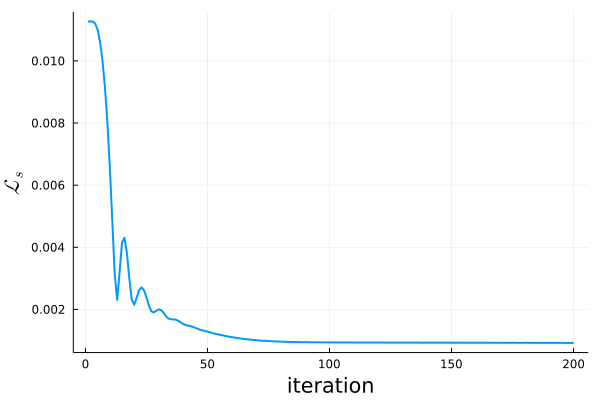

In [80]:
plot(sqrt.(losses),width = 2 ,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=false,legendfont=font(10))
xlabel!("iteration")
ylabel!(L"\mathcal{L}_s")

## Reference vs predicted

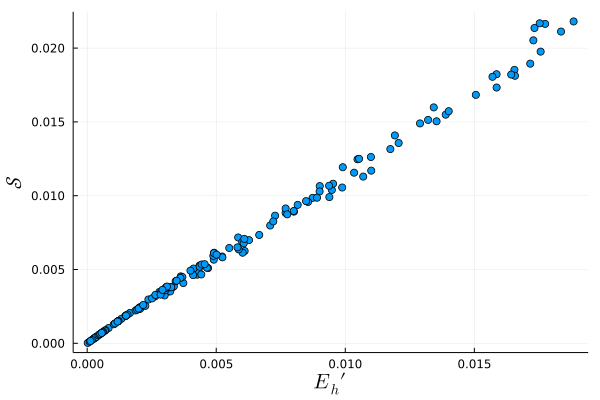

In [81]:
scatter(test_data["E_prime"],1/2*INTEG((T_mat*(test_data["u_prime"])).^2),xguidefontsize=14,yguidefontsize=14 ,dpi = 300, legend=false,legendfont=font(10))
xlabel!(L"E_h\prime")
ylabel!(L"\mathcal{S}")

## SGS energy during simulation

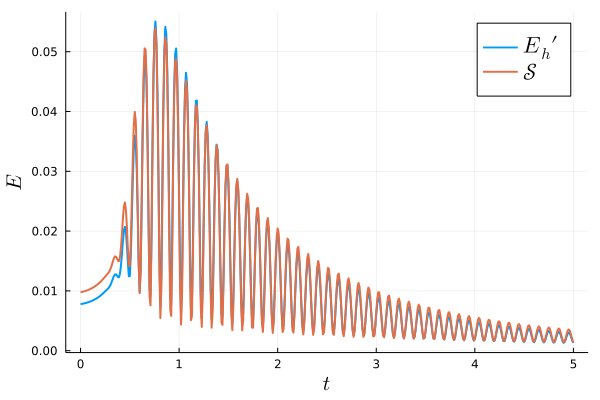

In [82]:
ss = R*T_mat*u_primes

plot(example_t,1/2*integ(u_primes.^2),width = 2,label = L"E_h\prime" ,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:topright,legendfont=font(15))
plot!(example_t,1/2*integ(ss.^2),width = 2,label = L"\mathcal{S}")
xlabel!(L"t")
ylabel!(L"E")

## Animate SGS compression

┌ Info: Saved animation to 
│   fn = /home/toby/Projects/ECNCM_1D/example_SGS_flow.gif
└ @ Plots /home/toby/.julia/packages/Plots/FCUr0/src/animation.jl:137


Plots.AnimatedGif("/home/toby/Projects/ECNCM_1D/example_SGS_flow.gif")
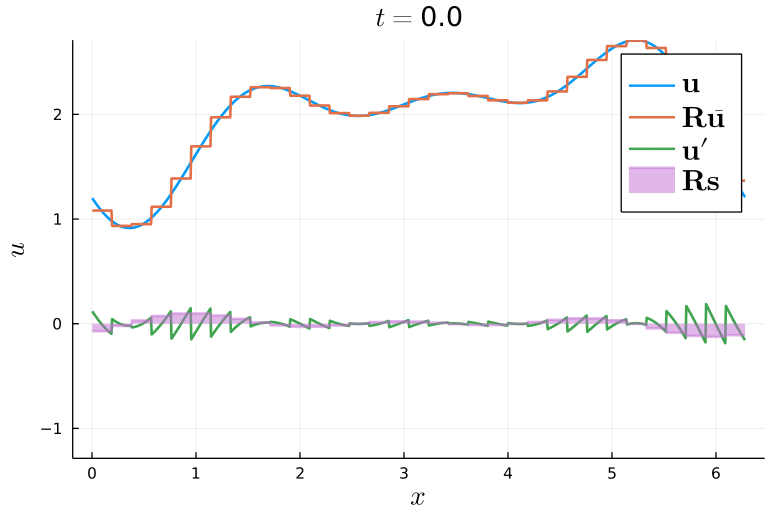

In [83]:
ymin = minimum([minimum(example_us),minimum(u_primes),minimum(ss)])
ymax = maximum(example_us)


anim = @animate for index in 1:size(example_us)[2]
    plot(ref_x,example_us[:,index],width = 2,label = L"\mathbf{u}" ,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:topright,legendfont=font(15), ylim=(ymin, ymax))
    plot!(x,u_bars[:,index],width = 2,label = L"\mathbf{R}\bar{\mathbf{u}}")
    plot!(x,u_primes[:,index],width = 2,label = L"\mathbf{u} \prime")
    plot!(x,ss[:,index],width = 2,label = L"\mathbf{R}\mathbf{s}",fill = 0,alpha = 0.5)
    xlabel!(L"x")
    ylabel!(L"u")
    title!(L"t = " * string(round(example_t[index],digits = 1)))
end

gif(anim, "example_SGS_flow.gif", fps = 30)

# Closure model

The challenge is now to construct a closure model that abides by the derived physical structure. For this we introduce the following framework

$$\frac{\mathrm{d}}{\mathrm{d}t}\begin{bmatrix}\bar{\mathbf{u}} \\ \mathbf{s}\end{bmatrix}\approx\begin{bmatrix}f_H(\bar{\mathbf{u}}) \\ \mathbf{0}_\Omega\end{bmatrix} +\underbrace{(\mathcal{K}-\mathcal{Q}^T\mathcal{Q}) \begin{bmatrix}\bar{\mathbf{u}} \\ \mathbf{s}\end{bmatrix}}_{=:\text{closure model}}$$

which consists of a matrix multiplaction of the solution vector $\begin{bmatrix}\bar{\mathbf{u}} \\ \mathbf{s}\end{bmatrix}$ with skew-symmetric $\mathcal{K}= -\mathcal{K}^T$ and negative-definite $-\mathcal{Q}^T \mathcal{Q}$ which non-linearly depend on the solution vector through a convolutional neural network (CNN). The construction of these matrices from the CNN outputs is carefully described in the paper. This formulation satisfies both momentum and energy conservation and is thus stable by design:

$$ \begin{bmatrix}\bar{\mathbf{u}} \\ \mathbf{s}\end{bmatrix}^T \begin{bmatrix}\boldsymbol{\Omega} & \\
& \boldsymbol{\Omega} \end{bmatrix}(\mathcal{K}-\mathcal{Q}^T\mathcal{Q})\begin{bmatrix}\bar{\mathbf{u}} \\ \mathbf{s}\end{bmatrix} =  -||\begin{bmatrix}\boldsymbol{\Omega} & \\
& \boldsymbol{\Omega} \end{bmatrix}\mathcal{Q}\begin{bmatrix}\bar{\mathbf{u}} \\ \mathbf{s}\end{bmatrix}||_2^2 \leq 0.$$

The model is trained on the training set through first derivative fitting, i.e. minizing

$$\mathcal{L} = ||\begin{bmatrix}f_H(\mathbf{u}) \\\mathbf{0}_\Omega\end{bmatrix} + \text{closure model} - \begin{bmatrix}\mathbf{W}\frac{\mathrm{d}\mathbf{u}}{\mathrm{d}t} \\\mathbf{T} \frac{\mathrm{d}\mathbf{u}^\prime}{\mathrm{d}t}\end{bmatrix} ||_2^2$$

with respect to the closure model parameters $\boldsymbol{\Theta}$, and then trajectory fitting, i.e. minimizing

$$\mathcal{L}^n =\sum^n_{i=1} ||\begin{bmatrix}\tilde{\bar{\mathbf{u}}}(t+i\overline{\Delta t}) \\ \tilde{\mathbf{s}}(t+i\overline{\Delta t})\end{bmatrix} - \begin{bmatrix}\bar{\mathbf{u}}(t+i\overline{\Delta t}) \\ \mathbf{s}(t+i\overline{\Delta t})\end{bmatrix} ||_2^2, $$

where $\overline{\Delta t}$ is the time-step size, $n$ the number of time-steps over which we evaluate the error, and $\tilde{}$ indicates the solution approximated by a closure model.

## Define model

Here, we define the closure model and its hyperparameters

In [84]:
constraints = true # Use a physics constraint CNN, needs supply_s to be turned on
supply_s = true # Use the SGS variables
dissipation =true # Add dissipation through -QQ^T


diagonals =1 # Diagonals to predict for the psi/phi matrices
stencil_width = 1 # Stencil width of the M matrices
kernel_widths = [1,1] # Kernel sizes of the CNN


channels = [30] # Hidden channels in the CNN



NN_descriptors = [stencil_width,kernel_widths,channels,diagonals] # Descriptors of the architecture

model, (conv_nn,stencils) = gen_model(f, constraints,supply_s,dissipation,NN_descriptors) # Construct the model

(model, (Chain(Conv((3,), 3 => 30, relu), Conv((3,), 30 => 17)), ([-0.6703200460356393, 1.0, -0.6703200460356393], [-0.6703200460356393, 1.0, -0.6703200460356393], [0.6703200460356393, -1.0, 0.6703200460356393], [-0.6703200460356393, 1.0, -0.6703200460356393], [0.6703200460356393, -1.0, 0.6703200460356393], [-0.6703200460356393, 1.0, -0.6703200460356393], [0.6703200460356393, -1.0, 0.6703200460356393], [-0.6703200460356393, 1.0, -0.6703200460356393], [0.6703200460356393, -1.0, 0.6703200460356393], [-0.6703200460356393, 1.0, -0.6703200460356393])))

## Load the data and for derivative fitting

In [85]:
batchsize =20
data_loader = Flux.Data.DataLoader((data["u_bar"],data["du_bar"],data["s"],data["ds"],data["a"],data["b"]), batchsize=batchsize,shuffle=true)# Defining our model, optimizatio


MLUtils.DataLoader{NTuple{6, Matrix{Float64}}, Random._GLOBAL_RNG, Val{nothing}}(([1.081092147964073 2.517700043513502 … 1.8133495144041203 2.5694971665367556; 0.9346695941235034 2.268912295681264 … 1.9067218077873633 2.4101462656490975; … ; 1.7348132518743242 2.084002284537429 … 2.022162050903737 1.947836845036998; 1.3664413776655377 2.079106078375784 … 2.0219658426135307 1.9599948209071172], [1.3183583234747887 3.033948564478801 … -0.9710940954280222 1.4233930335829967; 0.3742375935801846 3.1026049686360695 … -0.8618707384647378 2.7096726534920834; … ; 3.522777005112366 -0.15594391801128324 … 0.005098574358133249 -0.1589621300221103; 2.4627877499906097 0.24871423698115974 … 0.007709154498532837 -0.07326143592667334], [-0.07237082744747639 -0.07479909734192215 … 0.032869691319361447 -0.03480997142783845; -0.021371962275325316 -0.08471763171824197 … 0.027766890930139086 -0.07023696854793596; … ; -0.12542146262364468 0.004415991596310694 … -0.00011149657456282752 0.005101168798451654; -

## Load the data for trajectory fitting

We choose $\overline{\Delta t} = 0.01$ and $n=10$ to calculate $\mathcal{L}^n$.

In [86]:
increase_step_size = 1 # Increase time-step size w.r.t. time intervals in the training dataset
dt_bar = increase_step_size*save_every*dt # Time-step size of simulation with closure model

traj_steps = 10 # Amount of steps n for which to do trajectory fitting
traj_T = traj_steps*dt_bar # End time for trajectory fitting

trajectory_data = gen_trajectory_data((load("training_data.jld")[i] for i in ("us","dus","ts","as","bs","Fs")),f,indexes,domain_descriptors;increase_step_size=increase_step_size,traj_steps=traj_steps,T_mat=T_mat)

batchsize =20
traj_data_loader = Flux.Data.DataLoader((trajectory_data["u_bar"] ,trajectory_data["s"] ,trajectory_data["a"],trajectory_data["b"],trajectory_data["F"]), batchsize=batchsize,shuffle=true)# Defining our model, optimization algorithm and loss function


MLUtils.DataLoader{NTuple{5, Array{Float64, 3}}, Random._GLOBAL_RNG, Val{nothing}}(([1.081092147964073 1.0946697703797832 … 1.2391453337249134 1.263061407608636; 0.9346695941235034 0.9386344484346493 … 0.9886641425529888 0.9976586947653792; … ; 1.7348132518743242 1.7707715555300114 … 2.109256099493125 2.1564740757970142; 1.3664413776655377 1.3917273938247174 … 1.6519344268825906 1.693234737973218;;; 2.205696314513456 2.2111590609626224 … 2.2118308689699973 2.208557391531067; 2.097987175514646 2.112248652428494 … 2.2046420012770995 2.209899196555149; … ; 2.175009055596802 2.1694056560079327 … 2.1215563769176518 2.1153471312119048; 2.2139241305829893 2.2106493801319065 … 2.1734006021708194 2.167920981407405;;; 1.1578845522878274 1.1762760665119159 … 1.377575617910222 1.4118692856505923; 0.9592447002924159 0.9656973518068488 … 1.0418108218684596 1.0552689482366073; … ; 1.9293694017178509 1.9725906419297137 … 2.3449195374704246 2.3897192524975077; 1.5075944072210967 1.5407457901257944 … 1.

## Define loss functions

In [87]:
if supply_s ## Whether the loss should also be calculated over the SGS variables
    subgrid_l = true
else
    subgrid_l = false
end

loss(us,dus,ss,dss,as,bs,domain_descriptors = domain_descriptors,model = model,subgrid_loss = subgrid_l) = loss_function(us,dus,ss,dss,as,bs,domain_descriptors,model,subgrid_loss = subgrid_loss)
traj_loss(us,ss,as,bs,Fs,domain_descriptors = domain_descriptors,model = model,traj_dt = dt_bar,T = traj_T,subgrid_loss = subgrid_l) = trajectory_loss_function(us,ss,as,bs,Fs,domain_descriptors,model,traj_dt,T,subgrid_loss = subgrid_loss)

traj_loss (generic function with 6 methods)

## Derivative fitting

In [88]:
opt = ADAM()
ps = Flux.params(conv_nn,stencils)
epochs =100
losses = zeros(epochs)
    
for i in tqdm(1:epochs)
    Flux.train!(loss, ps,data_loader, opt)
    train_loss = loss(data["u_bar"],data["du_bar"],data["s"],data["ds"],data["a"],data["b"])
    losses[i] = train_loss
end

0.0%┣                                              ┫ 0/100 [00:00<00:-5, -0s/it]
1.0%┣▍                                         ┫ 1/100 [00:02<Inf:Inf, InfGs/it]
2.0%┣█                                              ┫ 2/100 [00:02<04:02, 2s/it]
3.0%┣█▍                                             ┫ 3/100 [00:03<02:24, 1s/it]
4.0%┣█▉                                             ┫ 4/100 [00:03<01:52, 1s/it]
5.0%┣██▍                                            ┫ 5/100 [00:04<01:35, 1s/it]
6.0%┣██▉                                            ┫ 6/100 [00:05<01:25, 1it/s]
7.0%┣███▎                                           ┫ 7/100 [00:05<01:18, 1it/s]
8.0%┣███▊                                           ┫ 8/100 [00:06<01:13, 1it/s]
9.0%┣████▎                                          ┫ 9/100 [00:06<01:09, 1it/s]
10.0%┣████▌                                        ┫ 10/100 [00:07<01:06, 1it/s]
11.0%┣█████                                        ┫ 11/100 [00:07<01:04, 1it/s]
12.0%┣█████▍                

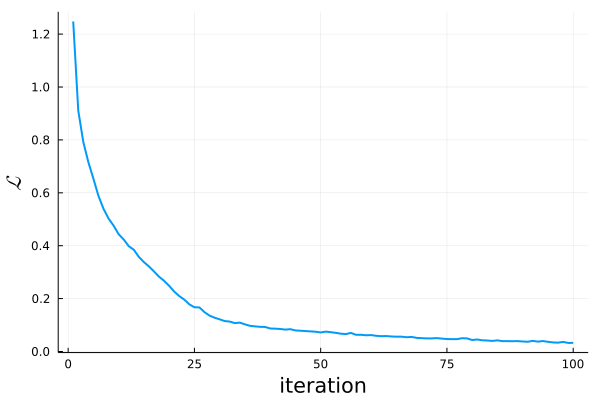

In [89]:
plot(losses,width = 2 ,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=false,legendfont=font(10))
xlabel!("iteration")
ylabel!(L"\mathcal{L}")

## Trajectory fitting

In [90]:
opt = ADAM()
ps = Flux.params(conv_nn,stencils)
epochs =30
traj_losses = zeros(epochs)
    
for i in tqdm(1:epochs)
    Flux.train!(traj_loss, ps,traj_data_loader, opt)
    train_loss = traj_loss(trajectory_data["u_bar"],trajectory_data["s"],trajectory_data["a"],trajectory_data["b"],trajectory_data["F"])
    traj_losses[i] = train_loss
end


0.0%┣                                               ┫ 0/30 [00:00<00:-2, -0s/it]
3.3%┣█▍                                         ┫ 1/30 [00:03<Inf:Inf, InfGs/it]
6.7%┣███▏                                            ┫ 2/30 [00:06<02:50, 6s/it]
10.0%┣████▊                                          ┫ 3/30 [00:09<02:01, 4s/it]
13.3%┣██████▎                                        ┫ 4/30 [00:12<01:42, 4s/it]
16.7%┣███████▉                                       ┫ 5/30 [00:14<01:29, 4s/it]
20.0%┣█████████▍                                     ┫ 6/30 [00:17<01:24, 3s/it]
23.3%┣███████████                                    ┫ 7/30 [00:20<01:18, 3s/it]
26.7%┣████████████▌                                  ┫ 8/30 [00:23<01:13, 3s/it]
30.0%┣██████████████                                 ┫ 9/30 [00:26<01:08, 3s/it]
33.3%┣███████████████▎                              ┫ 10/30 [00:29<01:05, 3s/it]
36.7%┣████████████████▉                             ┫ 11/30 [00:32<01:01, 3s/it]
40.0%┣██████████████████▍   

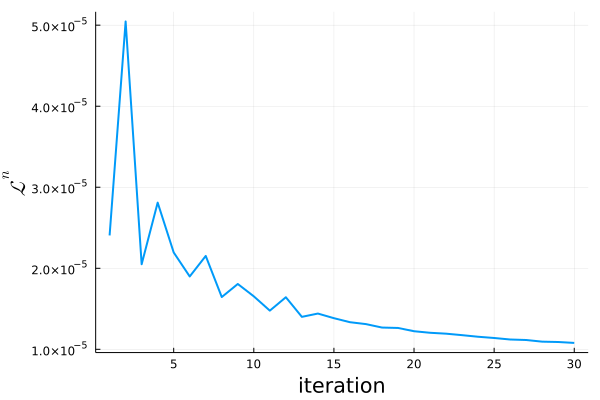

In [91]:
plot(traj_losses,width = 2 ,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=false,legendfont=font(10))
xlabel!("iteration")
ylabel!(L"\mathcal{L}^n")

# Offline testing

In [92]:
# Evaluate the model on the test data set
test_output = model(test_data["u_bar"],test_data["s"],X,test_data["a"],test_data["b"]) 
# Define no closure model RHS with the appropriate BCs
NC_f_with_BCs = padding_wrapper(f,eval_BCs = false,as =test_data["a"],bs =test_data["b"])

(::var"#pad_eval_f#26"{var"#burgers_dudt#123"{Chain{Tuple{Conv{1, 1, typeof(identity), Array{Float32, 3}, Bool}}}, Chain{Tuple{Conv{1, 1, typeof(identity), Array{Float32, 3}, Bool}}}, Float64}, Bool, Matrix{Float64}, Matrix{Float64}, var"#pad_eval_f#24#27"}) (generic function with 2 methods)

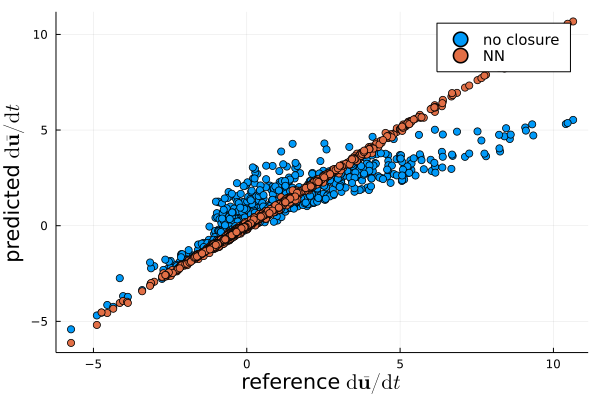

In [93]:
amount = 100 # Select 100 random samples from the test set to carry out the analysis
sel = shuffle(collect(1:size(test_data["u_bar"])[2]))[1:amount]

# Make a scatter plot
# adj_flatten() is used to flatten the array
scatter(adj_flatten(test_data["du_bar"][:,sel]),adj_flatten(NC_f_with_BCs(test_data["u_bar"],X,0)[:,sel]),label = "no closure",xguidefontsize=14,yguidefontsize=14 ,dpi = 300, legend=:topright,legendfont=font(10))
scatter!(adj_flatten(test_data["du_bar"][:,sel]),adj_flatten(test_output[1][:,sel]),label = "NN")
xlabel!("reference " * L"\mathrm{d}\bar{\mathbf{u}} /\mathrm{d}t")
ylabel!("predicted " * L"\mathrm{d}\bar{\mathbf{u}} /\mathrm{d}t")


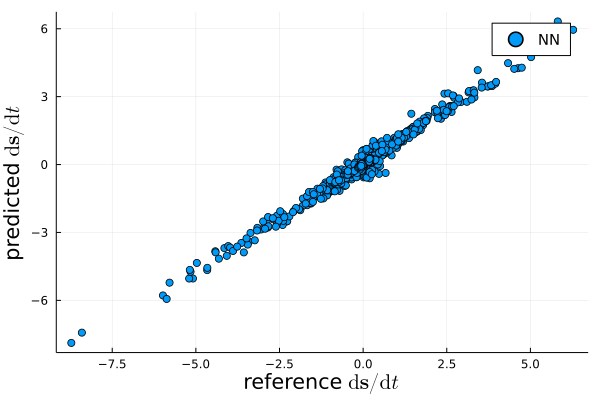

In [94]:
scatter(adj_flatten(test_data["ds"][:,sel]),adj_flatten(test_output[2][:,sel]),label = "NN",xguidefontsize=14,yguidefontsize=14 ,dpi = 300, legend=:topright,legendfont=font(10))
xlabel!("reference " * L"\mathrm{d}\mathbf{s} /\mathrm{d}t")
ylabel!("predicted " * L"\mathrm{d}\mathbf{s} /\mathrm{d}t")


# Simulations

## Generate initial condition with periodic or I/O BCs

As stated earier, we add some forcing to the I/O simulations. Forcing does not require closing as the commutator error is zero:

$$\bar{\mathbf{F}}= \mathbf{W}\mathbf{F}.$$

However, we still require the contribution of $\mathbf{F}$ to the SGS variables. This "SGS forcing" is simply obtained as

$$\mathbf{F}_s = \mathbf{T}(\mathbf{F}-\mathbf{R}\bar{\mathbf{F}}).$$

In this way the full system becomes

$$\frac{\mathrm{d}}{\mathrm{d}t}\begin{bmatrix}\bar{\mathbf{u}} \\ \mathbf{s}\end{bmatrix}\approx\begin{bmatrix}f_H(\bar{\mathbf{u}}) \\ \mathbf{0}_\Omega\end{bmatrix} +(\mathcal{K}-\mathcal{Q}^T\mathcal{Q}) \begin{bmatrix}\bar{\mathbf{u}} \\ \mathbf{s}\end{bmatrix} + \begin{bmatrix}
\bar{\mathbf{F}} \\
\mathbf{F}_s
\end{bmatrix}.$$

In [95]:
in_outflow = false

increase_fold = 2 # Make the domain larger w.r.t. to reference domain

large_domain_range =increase_fold*domain_range
large_I = increase_fold*I
large_N = increase_fold*N

# Generate descriptors for the larger domain
large_domain_descriptors=generate_domain_and_filters(large_domain_range,large_I,large_N)
large_domain_range,large_interpolation_matrix,(large_N,large_I,J),(large_X,large_x,large_ref_x),(large_Omega,large_omega,large_ref_omega),(large_W,large_R),(large_IP,large_ip,large_ref_ip),(large_INTEG,large_integ,large_ref_integ) = large_domain_descriptors

large_T_mat = gen_T(t_stencil,large_domain_descriptors) # construct the SGS filter for the larger domain

# Random initial condition with appropriate BCs
HR_u0,BC_f,a,b,F = gen_rand_condition(large_domain_descriptors,f,offset,increase_fold*min_mode,increase_fold*max_mode,in_outflow = in_outflow,scaling = scaling)

# Calculate the contribution of the forcing to \bar{u} and s
F_bar = large_W*large_interpolation_matrix*F
F_prime = large_interpolation_matrix*F .- large_R*F_bar
NN_F = [F_bar;large_T_mat*F_prime] # Combine the forcing contributions into one forcing term


# Sppropriate initial conditions
u0 = large_W*large_interpolation_matrix*HR_u0
s0 = large_T_mat*(large_interpolation_matrix*HR_u0 - large_R*u0)


66-element Vector{Float64}:
  0.1257176779635183
  0.06235547328584627
  0.07533080148806486
  0.10273738951685268
 -0.005568009207553343
 -0.2143935277519827
 -0.2877402260295267
 -0.0984168067498383
  0.16176522421231357
  0.20236944879418592
  0.007819259014110045
 -0.14039894729421548
 -0.03762284101993121
  ⋮
 -0.030632095704646103
  0.011250772508937842
 -0.05421055845476171
 -0.13886817087498687
 -0.08235146851722061
  0.09787632015574102
  0.19385219215768662
  0.08100170685299156
 -0.10197138362031773
 -0.12969891159456584
  0.015202652130462704
  0.1412114877928061

In [96]:
t = 0
T = 2.315

dt_bar = 0.01 # time-step for no closure en the NN
dt = 0.001 # time-step size for the reference model


save_interval = 2 # save results every 2 time-steps


NN_f = model_wrapper(model,as = a,bs = b,eval_BCs= true) # wrap the model with appropriate BCs

# simulate with closure model
NN_var,du,ts = simulation([u0;s0],large_X,dt_bar,T,NN_f,F = NN_F,save_every= save_interval)
NN_us = NN_var[1:size(large_X)[1],:]
NN_ss = NN_var[size(large_X)[1]+1:2*size(large_X)[1],:]

# simulate without closure model
NC_us = simulation(u0,large_X,dt_bar,T,BC_f,F = F_bar,save_every = save_interval,pre_allocate = false)[1]

# simulate reference model
HR_res = simulation(HR_u0,large_ref_x,dt,T,BC_f,F = F,save_every = save_interval*round(Int,dt_bar/dt))

# process reference simulation
HR_res = process_HR_solution(HR_res[1],HR_res[2],HR_res[3],large_domain_descriptors,BC_f,true)
HR_res["s"] = large_T_mat*HR_res["u_prime"]
HR_res["ds"] = large_T_mat*HR_res["du_prime"]


66×116 Matrix{Float64}:
  0.510867    0.20088   -0.063479  -0.256583  …   0.0545707    0.0258857
  0.391642    0.574659   0.59984    0.501095      0.904793     0.593459
 -0.746528   -0.483584  -0.178945   0.103591     -0.796991    -0.198481
  0.162008   -0.401875  -0.61864   -0.620522     -0.215841    -0.403345
  3.03978     2.10764    1.0456     0.262282      0.0832754    0.0446816
  2.00485     3.40371    3.88369    3.17397   …   0.251315     0.237353
 -1.84061    -1.38436    0.133445   2.83412      -0.160073    -0.0558586
 -2.12261    -2.52904   -3.21258   -4.19936      -0.171322    -0.207509
 -1.88676    -1.72846   -1.65389   -1.69213      -0.0458671   -0.0606595
  0.471198   -0.277985  -0.660108  -0.820124     -0.0046936   -0.014217
  2.8661      2.57921    1.83399    1.03243   …   4.10058      1.98744
  0.136175    1.09261    2.10743    2.71873      -4.07787     -4.18734
 -2.03265    -1.90775   -1.70557   -1.20717      -0.024004    -0.0570439
  ⋮                                  

## Energy plots

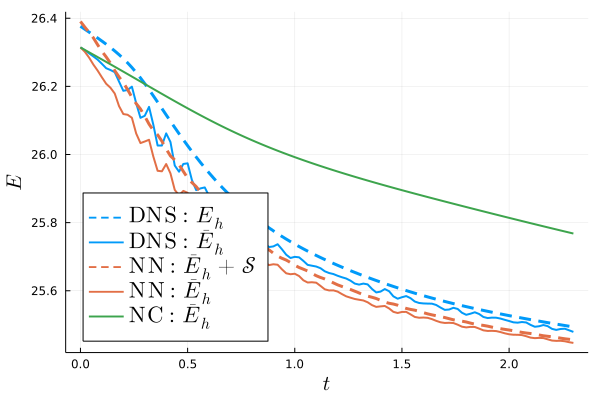

In [97]:
plot(HR_res["t"]',HR_res["E"],width = 3,label = L"\mathrm{DNS: } E_h" ,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:bottomleft,legendfont=font(15),linestyle = :dash)
plot!(HR_res["t"]',HR_res["E_bar"],width = 2,label = L"\mathrm{DNS: } \bar{E}_h",c = :1)
plot!(HR_res["t"]',1/2*large_INTEG(NN_us.^2).+1/2*large_INTEG(NN_ss.^2),width = 3,label = L"\mathrm{NN: } \bar{E}_h + \mathcal{S}",c = :2,linestyle = :dash)
plot!(HR_res["t"]',1/2*large_INTEG(NN_us.^2),width = 2,label = L"\mathrm{NN:} \bar{E}_h",c = :2)
plot!(HR_res["t"]',1/2*large_INTEG(NC_us.^2),width = 2,label = L"\mathrm{NC:} \bar{E}_h",c = :3)
xlabel!(L"t")
ylabel!(L"E")

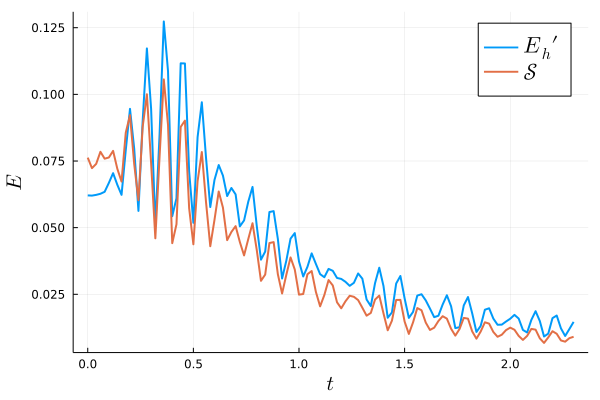

In [98]:
plot(HR_res["t"]',HR_res["E_prime"],width = 2,label = L"E_h\prime" ,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:topright,legendfont=font(15))
plot!(HR_res["t"]',1/2*large_INTEG(NN_ss.^2),width = 2,label = L"\mathcal{S}")
xlabel!(L"t")
ylabel!(L"E")

## Heatmaps of absolute error

In [99]:
AE_NC = abs.(NC_us .- large_W*HR_res["u"]) # absolute error no closure
AE_NN = abs.(NN_us .- large_W*HR_res["u"]) # absolute error NN

ymax = maximum([maximum(AE_NC),maximum(AE_NN)])
clims = (0,ymax)

(0, 0.9964353552386189)

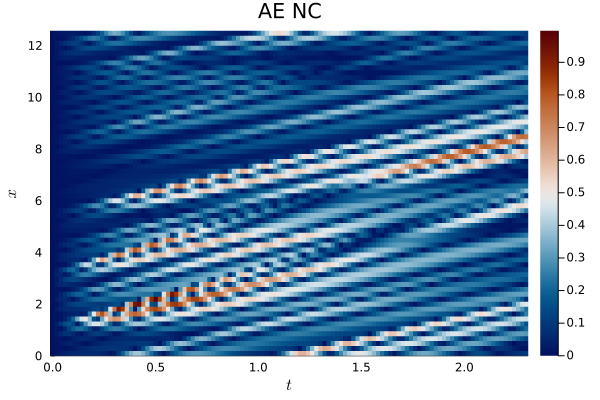

In [100]:
heatmap(HR_res["t"][1,:],large_X,abs.(NC_us .- large_W*HR_res["u"]),c = :vik,clims = clims)
xlabel!(L"t")
ylabel!(L"x")
title!("AE NC")

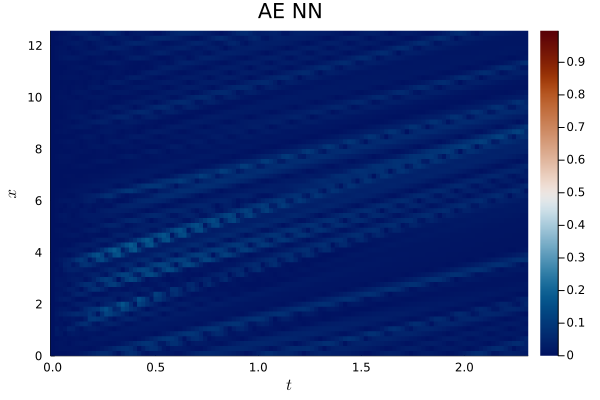

In [101]:
heatmap(HR_res["t"][1,:],large_X,abs.(NN_us .- large_W*HR_res["u"]),c = :vik,clims = clims)
xlabel!(L"t")
ylabel!(L"x")
title!("AE NN")

## Gifs

┌ Info: Saved animation to 
│   fn = /home/toby/Projects/ECNCM_1D/NN_flow.gif
└ @ Plots /home/toby/.julia/packages/Plots/FCUr0/src/animation.jl:137


Plots.AnimatedGif("/home/toby/Projects/ECNCM_1D/NN_flow.gif")
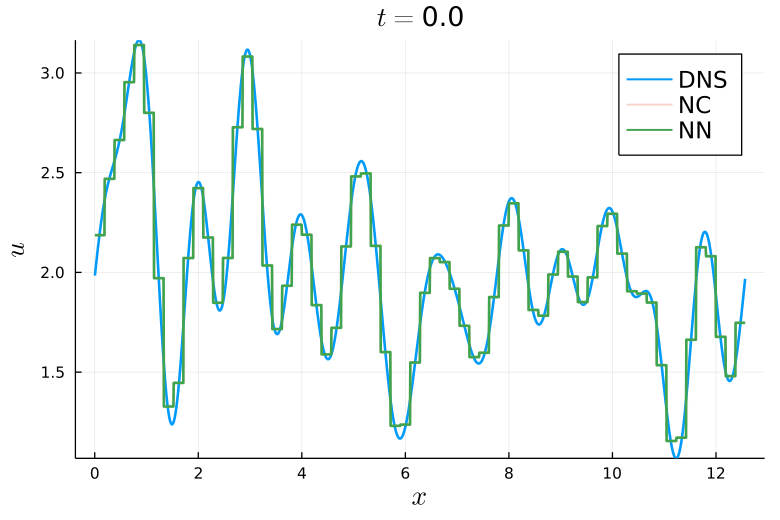

In [102]:
ymin = minimum(HR_res["u"])
ymax = maximum(HR_res["u"])

anim = @animate for index in 1:size(HR_res["t"])[2]
    plot(large_x,HR_res["u"][:,index],width = 2,label = "DNS" ,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:topright,legendfont=font(12), ylim=(ymin, ymax))
    plot!(large_x,large_R*NC_us[:,index],width = 2,label = "NC",alpha = 0.3)
    plot!(large_x,large_R*NN_us[:,index],width = 2,label = "NN")
    
    xlabel!(L"x")
    ylabel!(L"u")
    title!(L"t = " * string(round(HR_res["t"][index],digits = 1)))
end

gif(anim, "NN_flow.gif", fps = 30)

┌ Info: Saved animation to 
│   fn = /home/toby/Projects/ECNCM_1D/NN_SGS_flow.gif
└ @ Plots /home/toby/.julia/packages/Plots/FCUr0/src/animation.jl:137


Plots.AnimatedGif("/home/toby/Projects/ECNCM_1D/NN_SGS_flow.gif")
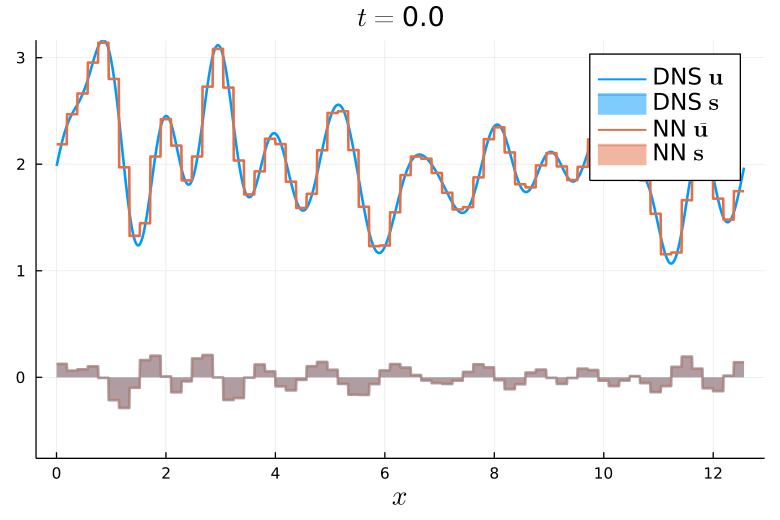

In [103]:
ymin = minimum([minimum(HR_res["s"]),minimum(HR_res["u"])])
ymax = maximum(HR_res["u"])

anim = @animate for index in 1:size(HR_res["t"])[2]
    plot(large_x,HR_res["u"][:,index],width = 2,label = "DNS " *L"\mathbf{u}"  ,xguidefontsize=14,yguidefontsize=14 ,dpi = 130, legend=:topright,legendfont=font(12), ylim=(ymin, ymax))
    plot!(large_x,large_R*HR_res["s"][:,index],width = 2,label = "DNS " *L"\mathbf{s}",alpha = 0.5,color = :1,fill = 0)
    plot!(large_x,large_R*NN_us[:,index],width = 2,label = "NN "*L"\bar{\mathbf{u}}",color = :2)
    plot!(large_x,large_R*NN_ss[:,index],width = 2,label = "NN "*L"\mathbf{s}",color = :2,fill = 0,alpha = 0.5)
    xlabel!(L"x")
    title!(L"t = " * string(round(HR_res["t"][index],digits = 1)))
end

gif(anim, "NN_SGS_flow.gif", fps = 30)